In [1]:
import numpy as np
from matplotlib import pyplot as plt
from astropy import units as u
from astropy import constants as c
from scipy.integrate import quad
from scipy.interpolate import CubicSpline
from scipy.optimize import curve_fit
from tqdm import tqdm

In [2]:
import ROOT as r
import warnings
warnings.filterwarnings('ignore')

In [3]:
r.gSystem.Load('$EVNDISPSYS/lib/libVAnaSum.so')

0

In [4]:
def get_distance(x1, y1, x2, y2):
    square = (x2-x1) ** 2 + (y2-y1) ** 2
    return np.sqrt(square)

In [5]:
def get_impact_factor(xi):

    rel_intensity_per_az = lambda phi, xi: np.sqrt(1 - xi**2 * np.sin(phi)**2)

    if xi > 1:
        bound = np.arcsin(1/xi)
    else:
        bound = np.pi/2
    
    integ = quad(rel_intensity_per_az, 0, bound, args=(xi))[0]
    return integ * 2 / np.pi

In [6]:
test_xis = np.linspace(0, 50, 10000)
test_factors = np.zeros_like(test_xis)

for i, xi in enumerate(test_xis):
    test_factors[i] = get_impact_factor(xi)

xi_from_factor = CubicSpline(test_factors[::-1], test_xis[::-1])
xi_from_xi_div_factor = CubicSpline(test_xis / test_factors, test_xis)

In [7]:
# 851000 has 100,000 muons per wobble
wobbles = ('0', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1', '1.1', '1.2', '1.3', '1.4')

In [8]:
# valid_sim_muon_params_per_wobble = []

# for w in tqdm(wobbles):

#     filename = '/raid/reedbuck/lrizk/veritas/simulations/evndisp/muons/851000_w' + w + '.root'
#     sim = r.TFile(filename)
#     params = sim.Get('Tel_2/tpars')

#     num_events = 0
#     for event in params:
#         if event.muonValid and event.muonRadius:
#             num_events += 1

#     sim_muon_params = np.zeros((8, num_events))
#     i = 0

#     for event in params:
#         if event.muonValid and event.muonRadius:
#             sim_muon_params[0][i] = event.muonX0
#             sim_muon_params[1][i] = event.muonY0
#             sim_muon_params[2][i] = event.muonXC
#             sim_muon_params[3][i] = event.muonYC
#             sim_muon_params[4][i] = event.muonRadius
#             sim_muon_params[5][i] = event.muonRSigma
#             sim_muon_params[6][i] = event.muonSize
#             sim_muon_params[7][i] = event.muonIPCorrectedSize
#             i += 1

#     valid_sim_muon_params_per_wobble.append(sim_muon_params)

In [9]:
sim_muon_params_per_wobble = []

for w in tqdm(wobbles):
    
    filename_mu = '/raid/reedbuck/lrizk/veritas/simulations/evndisp/muons/851000_w' + w + '_hough.root'
    sim_mu = r.TFile(filename_mu)
    params_mu = sim_mu.Get('Tel_2/tpars')
    
    filename_mm = '/raid/reedbuck/lrizk/veritas/simulations/evndisp/muons/850000_w' + w + '_hough.root'
    sim_mm = r.TFile(filename_mm)
    params_mm = sim_mm.Get('Tel_2/tpars')

    num_events = 0
    for event in params_mu:
        if event.muonRadius:
            num_events += 1
    for event in params_mm:
        if event.muonRadius:
            num_events += 1

    sim_muon_params = np.zeros((9, num_events))
    i = 0

    for event in params_mu:
        if event.muonRadius:
            sim_muon_params[0][i] = event.muonX0
            sim_muon_params[1][i] = event.muonY0
            sim_muon_params[2][i] = event.muonXC
            sim_muon_params[3][i] = event.muonYC
            sim_muon_params[4][i] = event.muonRadius
            sim_muon_params[5][i] = event.muonRSigma
            sim_muon_params[6][i] = event.muonSize
            sim_muon_params[7][i] = event.muonIPCorrectedSize
            sim_muon_params[8][i] = event.muonValid
            i += 1
            
    for event in params_mm:
        if event.muonRadius:
            sim_muon_params[0][i] = event.muonX0
            sim_muon_params[1][i] = event.muonY0
            sim_muon_params[2][i] = event.muonXC
            sim_muon_params[3][i] = event.muonYC
            sim_muon_params[4][i] = event.muonRadius
            sim_muon_params[5][i] = event.muonRSigma
            sim_muon_params[6][i] = event.muonSize
            sim_muon_params[7][i] = event.muonIPCorrectedSize
            sim_muon_params[8][i] = event.muonValid
            i += 1

    sim_muon_params_per_wobble.append(sim_muon_params)

100%|██████████| 15/15 [02:35<00:00, 10.37s/it]


In [10]:
# for i, w in enumerate(wobbles):
#     output = 'sim_data/muons_851000_w' + w + '.csv'
#     np.savetxt(output, sim_muon_params_per_wobble[i].T, delimiter=',')

In [11]:
# sims = 'sim_data/muons_851000_w0.csv'
# muon_x, muon_y, muon_xc, muon_yc, muon_radii, muon_radii_err, muon_sizes, muon_corr_sizes = np.loadtxt(sims, delimiter=',', unpack=True)

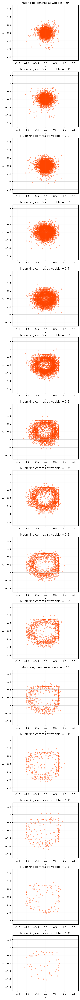

In [12]:
plt.figure(figsize=(5, 75))

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    positions = sim_muon_params_per_wobble[i][:2]

    plt.subplot(15, 1, i+1)

    plt.scatter(positions[0][validity], positions[1][validity], c='orangered', marker='o', s=10, alpha=0.4)

    plt.xlim(-1.75, 1.75)
    plt.ylim(-1.75, 1.75)

    plt.grid(alpha=0.4)
    plt.xlabel(r'$x$')
    plt.ylabel(r'$y$')
    plt.title('Muon ring centres at wobble = ' + w + '°')

plt.show()

In [13]:
sim_muons_w0_params = sim_muon_params_per_wobble[0]

In [14]:
distances = get_distance(*sim_muons_w0_params[:4])
radii = sim_muons_w0_params[4]
radii_err = sim_muons_w0_params[5]
corr_sizes = sim_muons_w0_params[7]
evndisp_factors = sim_muons_w0_params[6] / corr_sizes
evndisp_xis = xi_from_factor(evndisp_factors)
validity = np.array([bool(v) for v in sim_muons_w0_params[8]])

In [15]:
recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
recalc_factors = np.zeros_like(recalc_xis)

for i, xi in enumerate(recalc_xis):
    recalc_factors[i] = get_impact_factor(xi)

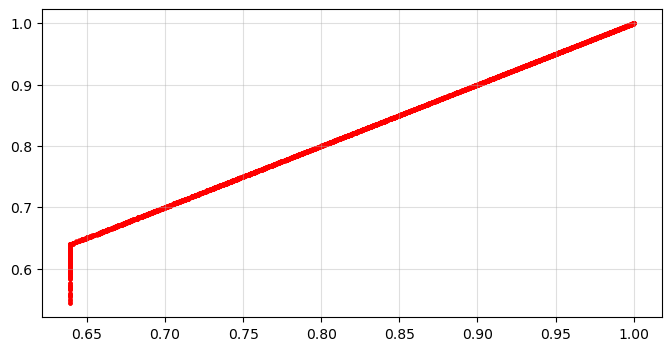

In [16]:
plt.figure(figsize=(8, 4))

plt.scatter(evndisp_factors, recalc_factors, c='red', marker='o', s=5)

plt.grid(alpha=0.4)
plt.show()

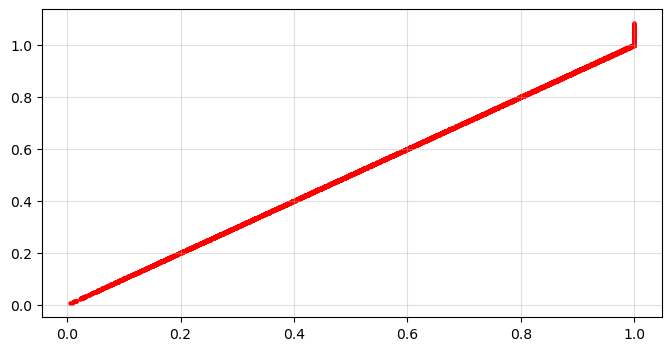

In [17]:
plt.figure(figsize=(8, 4))

plt.scatter(evndisp_xis, recalc_xis, c='red', marker='o', s=5)

plt.grid(alpha=0.4)
plt.show()

In [18]:
np.max(evndisp_xis), np.max(recalc_xis)

(nan, 2.4644136354311805)

In [19]:
np.max(evndisp_xis), np.max(recalc_xis)

(nan, 2.4644136354311805)

In [20]:
for params in sim_muon_params_per_wobble:
    print(np.mean(params[6]))

559.3019516045506
559.7373774960698
542.5376644212873
553.1252409285175
530.3973192274342
496.05782983333035
428.05259388116286
391.49646305979593
341.0914482254268
309.3620944214621
245.3796705276921
178.43670194771542
127.99860652194053
92.61852899086433
50.08074355230288


In [21]:
print("num_valid, num_total")
for params in sim_muon_params_per_wobble:
    validity = np.array([bool(v) for v in params[8]])
    print(len(params[1][validity]), len(params[1]))

num_valid, num_total
4043 59861
4047 59794
4031 59641
3982 59665
3703 58817
3030 55619
2243 51701
1578 47428
1133 43757
789 40490
489 37285
302 34733
180 32383
115 30266
56 28421


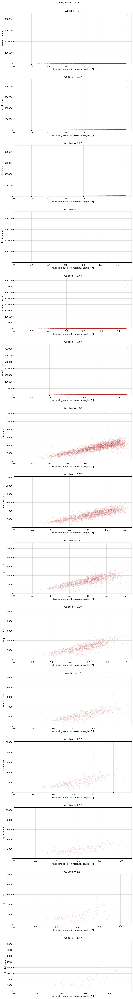

In [22]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    plt.subplot(15, 1, i+1)
    plt.scatter(radii, corr_sizes, c='firebrick', marker='o', s=10, alpha=0.1)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

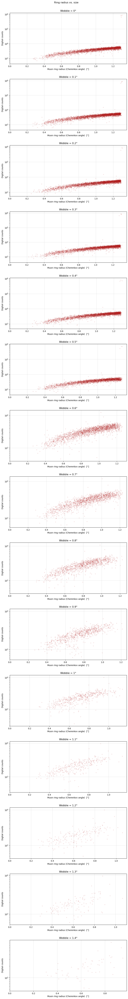

In [23]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    plt.subplot(15, 1, i+1)
    plt.scatter(radii, corr_sizes, c='firebrick', marker='o', s=10, alpha=0.1)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.yscale('log')

plt.suptitle('Ring radius vs. size')
plt.show()

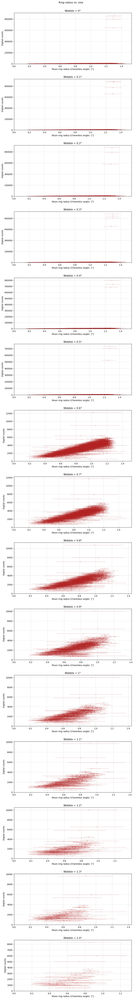

In [24]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=radii, xerr=radii_err, y=corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

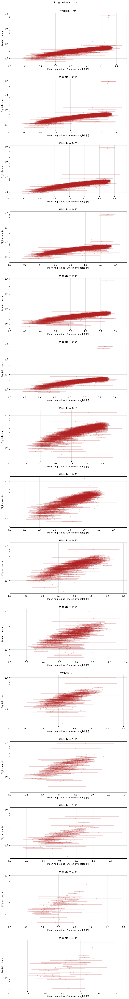

In [25]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=radii, xerr=radii_err, y=corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.yscale('log')

plt.suptitle('Ring radius vs. size')
plt.show()

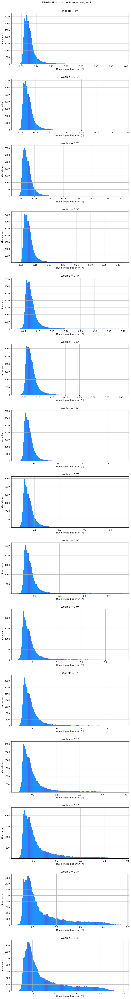

In [26]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    #validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii_err = sim_muon_params_per_wobble[i][5]#[validity]
    
    plt.subplot(15, 1, i+1)
    hist_data = plt.hist(radii_err, bins=100, edgecolor='royalblue', color='dodgerblue')

    plt.grid(alpha=0.8)
    plt.xlabel('Muon ring radius error  [°]')
    plt.ylabel('Abundance')
    plt.title('Wobble = ' + w + '°')
    
plt.suptitle('Distribution of errors in muon ring radius')
plt.show()

In [51]:
err_cutoff = 0.12

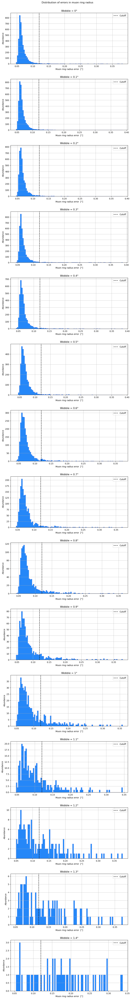

In [52]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    plt.subplot(15, 1, i+1)
    hist_data = plt.hist(radii_err, bins=100, edgecolor='royalblue', color='dodgerblue')
    plt.axvline(x=err_cutoff, c='black', ls='--', label='Cutoff')

    plt.grid(alpha=0.8)
    plt.xlabel('Muon ring radius error  [°]')
    plt.ylabel('Abundance')
    plt.title('Wobble = ' + w + '°')
    plt.legend()
    
plt.suptitle('Distribution of errors in muon ring radius')
plt.show()

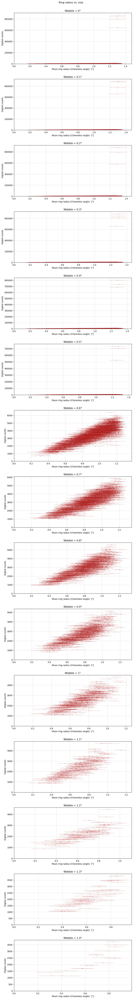

In [53]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=good_radii, xerr=good_radii_err, y=good_corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

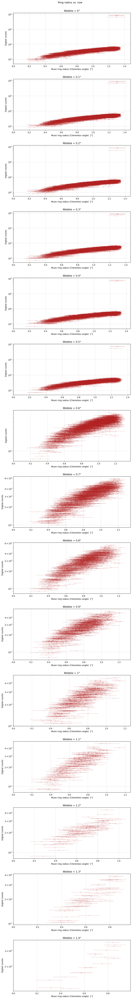

In [54]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=good_radii, xerr=good_radii_err, y=good_corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.yscale('log')

plt.suptitle('Ring radius vs. size')
plt.show()

In [55]:
def linear_0(y, a):

    a_prime = 1/a
    
    return a_prime * y

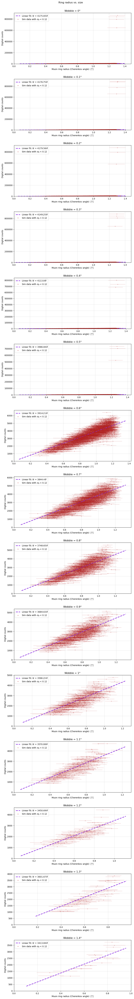

In [56]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]

    fit_0 = curve_fit(
    linear_0,
    xdata=good_corr_sizes[:-6], 
    ydata=good_radii[:-6],
    sigma=good_radii_err[:-6], 
    absolute_sigma=True, 
    p0=[5000],
    )

    slope_0 = fit_0[0][0]
    angles_range = np.linspace(np.min(good_radii) - 0.2, np.max(good_radii) + 0.1, 1000)
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=good_radii, xerr=good_radii_err, y=good_corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2,
                 label=r'Sim data with $\sigma_\theta$ < {}'.format(round(err_cutoff, 2)))
    plt.plot(angles_range, slope_0 * angles_range, c='blueviolet', lw=2.5, ls='--',
             label=r'Linear fit: $N \, = \, {} \, \theta$'.format(round(slope_0, 2)))

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.legend()
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

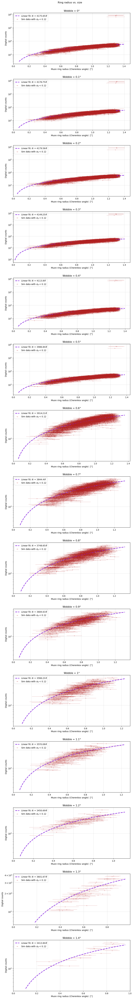

In [57]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]

    fit_0 = curve_fit(
    linear_0,
    xdata=good_corr_sizes[:-6], 
    ydata=good_radii[:-6],
    sigma=good_radii_err[:-6], 
    absolute_sigma=True, 
    p0=[5000],
    )

    slope_0 = fit_0[0][0]
    angles_range = np.linspace(np.min(good_radii) - 0.2, np.max(good_radii) + 0.1, 1000)
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=good_radii, xerr=good_radii_err, y=good_corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2,
                 label=r'Sim data with $\sigma_\theta$ < {}'.format(round(err_cutoff, 2)))
    plt.plot(angles_range, slope_0 * angles_range, c='blueviolet', lw=2.5, ls='--',
             label=r'Linear fit: $N \, = \, {} \, \theta$'.format(round(slope_0, 2)))

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.legend()
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.yscale('log')

plt.suptitle('Ring radius vs. size')
plt.show()

In [58]:
# Chi2 test

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]

    fit_0 = curve_fit(
    linear_0,
    xdata=good_corr_sizes[:-6], 
    ydata=good_radii[:-6],
    sigma=good_radii_err[:-6], 
    absolute_sigma=True, 
    p0=[5000],
    )

    slope_0 = fit_0[0][0]
    model_guesses_0 = linear_0(good_corr_sizes, slope_0)

    chi2 = np.sum((model_guesses_0 - good_radii)**2 / (good_radii_err)**2)
    dof = len(model_guesses_0) - 1
    red_chi2 = chi2/dof
    print('Wobble = {}°'.format(w) + ': reduced chi^2', red_chi2)

Wobble = 0°: reduced chi^2 3613.3424595944216
Wobble = 0.1°: reduced chi^2 3462.9534144729732
Wobble = 0.2°: reduced chi^2 2331.8622530907164
Wobble = 0.3°: reduced chi^2 4193.896305120209
Wobble = 0.4°: reduced chi^2 2911.2205161563916
Wobble = 0.5°: reduced chi^2 3188.887948110002
Wobble = 0.6°: reduced chi^2 4.419025413409006
Wobble = 0.7°: reduced chi^2 3.6586968495800374
Wobble = 0.8°: reduced chi^2 3.7281891575456076
Wobble = 0.9°: reduced chi^2 3.0782106111409697
Wobble = 1°: reduced chi^2 2.634818721360671
Wobble = 1.1°: reduced chi^2 2.294940987890248
Wobble = 1.2°: reduced chi^2 2.2454840145767103
Wobble = 1.3°: reduced chi^2 2.3197557497204113
Wobble = 1.4°: reduced chi^2 2.820277453305977


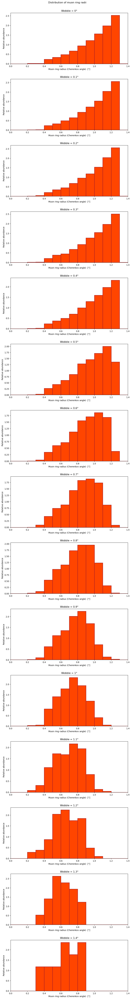

In [59]:
histobins = np.arange(0, 1.5, 0.1)

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]

    good_radii = radii[radii_err < err_cutoff]

    plt.subplot(15, 1, i+1)
    plt.hist(good_radii, bins=histobins, density=True, edgecolor='firebrick', lw=2, color='orangered')
    plt.xlim(histobins[0], histobins[-1])
    
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Relative abundance')
    plt.title('Wobble = ' + w + '°')

plt.suptitle('Distribution of muon ring radii')
plt.show()

In [60]:
muon_mass = (105.65837 * u.MeV/c.c**2).to(u.kg).value  # kg
veritas_alt = 1268  # m
optimal_wvl = 380*1e-9

def n_air(lam, alt=veritas_alt):

    # Empirically determined constants
    A = 2.73e-4 
    B = 1.23e-18  # m^2
    C = 3.56e-32  # m^4
    
    # Scale height of the atmosphere
    h_0 = 8.4e3  # m

    epsilon_0 = A + B/lam**2 + C/lam**4
    epsilon = epsilon_0 * np.exp(-alt / h_0)
    
    return 1 + epsilon

def get_beta(E, m=c.m_e.value):

    return np.sqrt(1 - m**2 * c.c.value**4 / E**2)

def get_cherenkov_angle(beta, n):

    return np.arccos(1 / (beta * n))

def dNdtheta(theta, N_tot, E_min, E_max, index, n, m):

    a = N_tot * (index+1) / (E_max**(index+1) - E_min**(index+1))

    A = a * (m * c.c.value**2) ** (index+1)
    B = (1 - n**-2 * np.cos(theta)**-2) ** (-0.5*index - 1.5)
    C = np.tan(theta) * n**-2 * np.cos(theta)**-2

    return A * B * C

E_min = 5.3 * u.GeV.to(u.J)  # J
E_max = 1e4 * u.GeV.to(u.J)  # J
index = -2.7

reference_n = n_air(optimal_wvl)
asymptotic_theta = get_cherenkov_angle(beta=1, n=reference_n)
sample_thetas = np.linspace(
    get_cherenkov_angle(beta=get_beta(E_min, m=muon_mass), n=reference_n),
    get_cherenkov_angle(beta=get_beta(E_max, m=muon_mass), n=reference_n),
    10000
)

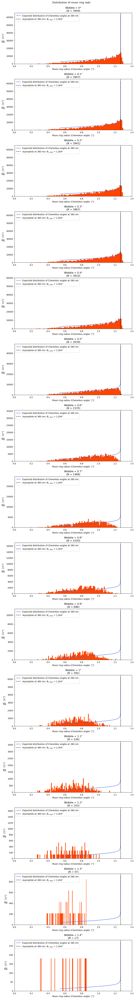

In [61]:
histobins = np.arange(0, 1.5, 0.1)

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]

    good_radii = radii[radii_err < err_cutoff]
    N_tot = len(good_radii)

    histo_values, bin_edges = np.histogram(good_radii, bins=100, density=True)

    plt.subplot(15, 1, i+1)
    plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered')  # Area of all bins = N_tot
    
    plt.plot(sample_thetas / np.pi * 180, 
             dNdtheta(sample_thetas, N_tot, E_min, E_max, index, n=reference_n, m=muon_mass) 
             * np.pi / 180,
             c='royalblue', lw=1.5,
             label='Expected distribution of Cherenkov angles at {} nm'.format(int(optimal_wvl * 1e9)))
    
    plt.axvline(asymptotic_theta / np.pi * 180, 
                label='Asymptote at {} nm: '.format(int(optimal_wvl * 1e9))
                + r'$\theta_{C, \mathrm{max}}$ = ' 
                + str(round(asymptotic_theta / np.pi * 180, 3)) + '°',
                c='black', lw=1.5, ls='--')
    
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel(r'$\frac{dN}{d\theta_C}$  [1/°]')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(histobins[0], histobins[-1])
    plt.legend()

plt.suptitle('Distribution of muon ring radii')
plt.show()

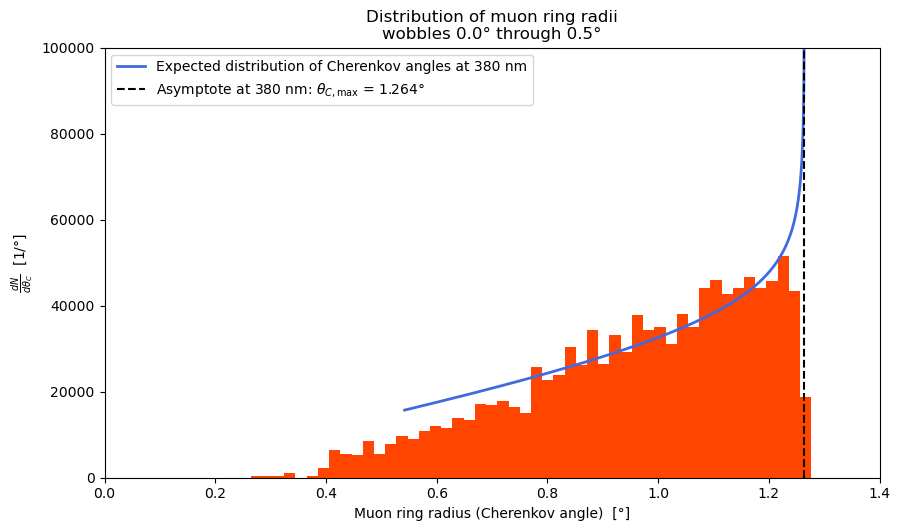

In [62]:
histobins = np.arange(0, 1.5, 0.1)

plt.figure(figsize=(10, 5))
plt.subplots_adjust(top=0.97, hspace=0.3)

all_good_radii = []

for i, w in enumerate(wobbles[:6]):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]

    good_radii = radii[radii_err < err_cutoff]
    all_good_radii += good_radii.tolist()

all_good_radii = np.array(all_good_radii)
N_tot = len(all_good_radii)

histo_values, bin_edges = np.histogram(good_radii, bins=50, density=True)

plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered')  # Area of all bins = N_tot

plt.plot(sample_thetas / np.pi * 180, 
         dNdtheta(sample_thetas, N_tot, E_min, E_max, index, n=reference_n, m=muon_mass) 
         * np.pi / 180,
         c='royalblue', lw=2,
         label='Expected distribution of Cherenkov angles at {} nm'.format(int(optimal_wvl * 1e9)))

plt.axvline(asymptotic_theta / np.pi * 180, 
            label='Asymptote at {} nm: '.format(int(optimal_wvl * 1e9))
            + r'$\theta_{C, \mathrm{max}}$ = ' 
            + str(round(asymptotic_theta / np.pi * 180, 3)) + '°',
            c='black', lw=1.5, ls='--')

plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
plt.ylabel(r'$\frac{dN}{d\theta_C}$  [1/°]')
plt.title('Distribution of muon ring radii\n' + 'wobbles 0.0° through {}°'.format(w))

plt.xlim(histobins[0], histobins[-1])
plt.ylim(0, 1e5)
plt.legend()

plt.show()

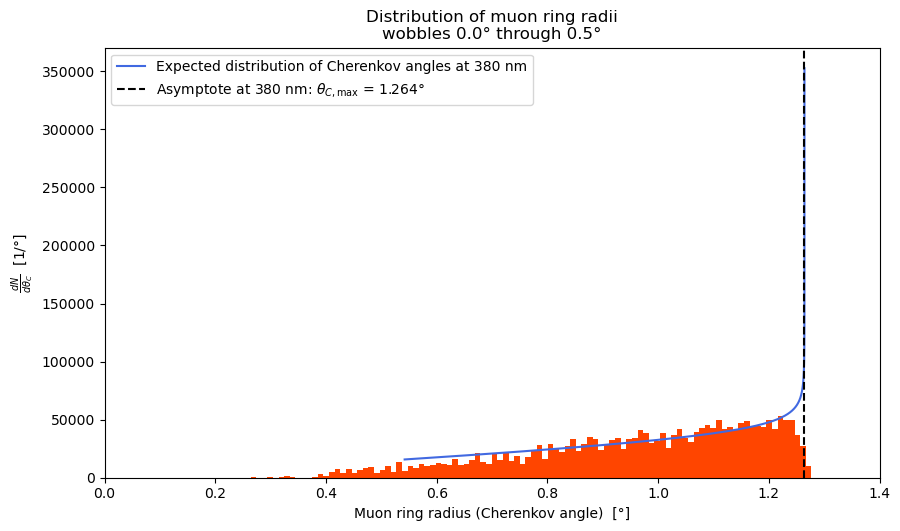

In [63]:
histobins = np.arange(0, 1.5, 0.1)

plt.figure(figsize=(10, 5))
plt.subplots_adjust(top=0.97, hspace=0.3)

all_good_radii = []

for i, w in enumerate(wobbles[:6]):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]

    good_radii = radii[radii_err < err_cutoff]
    all_good_radii += good_radii.tolist()

all_good_radii = np.array(all_good_radii)
N_tot = len(all_good_radii)

histo_values, bin_edges = np.histogram(good_radii, bins=100, density=True)

plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered')  # Area of all bins = N_tot

plt.plot(sample_thetas / np.pi * 180, 
         dNdtheta(sample_thetas, N_tot, E_min, E_max, index, n=reference_n, m=muon_mass) 
         * np.pi / 180,
         c='royalblue', lw=1.5,
         label='Expected distribution of Cherenkov angles at {} nm'.format(int(optimal_wvl * 1e9)))

plt.axvline(asymptotic_theta / np.pi * 180, 
            label='Asymptote at {} nm: '.format(int(optimal_wvl * 1e9))
            + r'$\theta_{C, \mathrm{max}}$ = ' 
            + str(round(asymptotic_theta / np.pi * 180, 3)) + '°',
            c='black', lw=1.5, ls='--')

plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
plt.ylabel(r'$\frac{dN}{d\theta_C}$  [1/°]')
plt.title('Distribution of muon ring radii\n' + 'wobbles 0.0° through {}°'.format(w))

plt.xlim(histobins[0], histobins[-1])
plt.legend()

plt.show()

In [64]:
def dNdxi(xi, N_tot, xi_max):
    return N_tot / xi_max**2 * (2 * xi)

xi_max = 3

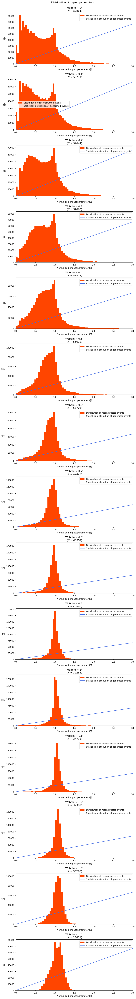

In [65]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=60, density=True)

    plt.subplot(15, 1, i+1)
    plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered', 
               label='Distribution of reconstructed events')  # Area of all bins = N_tot
    
    plt.plot(sample_xis, dNdxi(sample_xis, 1e5 + 6, xi_max), c='royalblue', lw=1.5,
             label='Statistical distribution of generated events')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$\frac{dN}{d\xi}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])
    plt.legend()

plt.suptitle('Distribution of impact parameters')
plt.show()

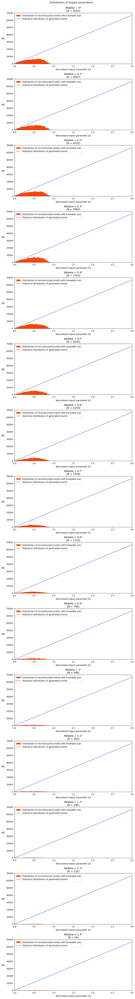

In [66]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)[validity]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=20, density=True)

    plt.subplot(15, 1, i+1)
    plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered', 
               label='Distribution of reconstructed events with knowable size')  # Area of all bins = N_tot
    
    plt.plot(sample_xis, dNdxi(sample_xis, 1e5 + 6, xi_max), c='royalblue', lw=1.5,
             label='Statistical distribution of generated events')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$\frac{dN}{d\xi}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])
    plt.legend()

plt.suptitle('Distribution of impact parameters')
plt.show()

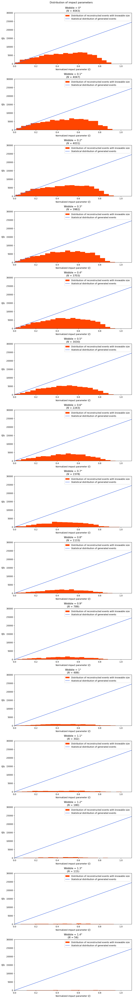

In [67]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)[validity]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=20, density=True)

    plt.subplot(15, 1, i+1)
    plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered', 
               label='Distribution of reconstructed events with knowable size')  # Area of all bins = N_tot
    
    plt.plot(sample_xis, dNdxi(sample_xis, 1e5 + 6, xi_max), c='royalblue', lw=1.5,
             label='Statistical distribution of generated events')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$\frac{dN}{d\xi}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    #plt.xlim(sample_xis[0], sample_xis[-1])
    plt.xlim(0, 1.1)
    plt.ylim(0, 30000)
    plt.legend()

plt.suptitle('Distribution of impact parameters')
plt.show()

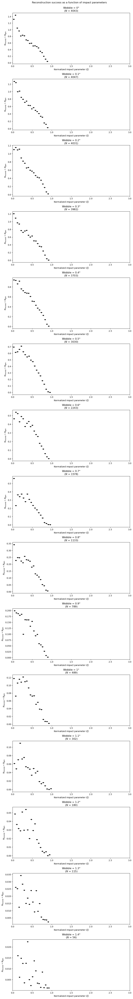

In [68]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)[validity]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=20, density=True)
    bin_interval = bin_edges[1] - bin_edges[0]
    mid_bins = bin_edges[:-1] + bin_interval/2

    ratios = np.zeros_like(mid_bins)
    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j] * N_tot * bin_interval
        dN_g = dNdxi(xi, 1e5 + 6, xi_max) * bin_interval
        ratios[j] = dN_r / dN_g
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=mid_bins, xerr=bin_interval/2, y=ratios, c='black', marker='o', ms=4, ls='')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$N_\mathrm{reconst} \div N_\mathrm{gen}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])

plt.suptitle('Reconstruction success as a function of impact parameters')
plt.show()

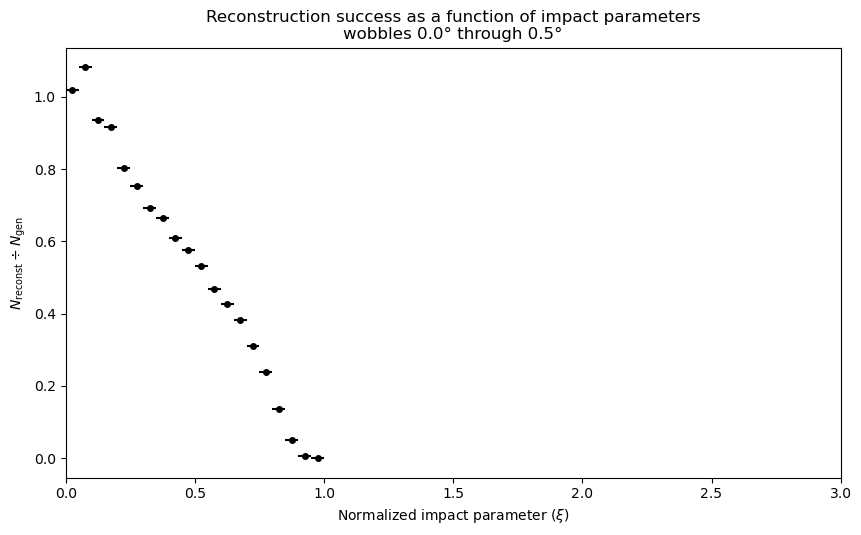

In [69]:
num_wobbles = 6

sample_xis = np.arange(0, 3.1, 0.1) 

bin_interval = 0.05
bin_edges = np.arange(0, 1 + bin_interval, bin_interval)
mid_bins = bin_edges[:-1] + bin_interval/2
ratios = np.zeros_like(mid_bins)

plt.figure(figsize=(10, 5))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles[:num_wobbles]):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)[validity]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    # N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=bin_edges, density=False)

    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j]
        dN_g = dNdxi(xi, num_wobbles * (1e5 + 6), xi_max) * bin_interval
        ratios[j] += dN_r / dN_g
    
plt.errorbar(x=mid_bins, xerr=bin_interval/2, y=ratios, c='black', marker='o', ms=4, ls='')

plt.xlabel(r'Normalized impact parameter ($\xi$)')
plt.ylabel(r'$N_\mathrm{reconst} \div N_\mathrm{gen}$')
plt.title('Reconstruction success as a function of impact parameters\n' + 'wobbles 0.0° through {}°'.format(w))

plt.xlim(sample_xis[0], sample_xis[-1])

plt.show()

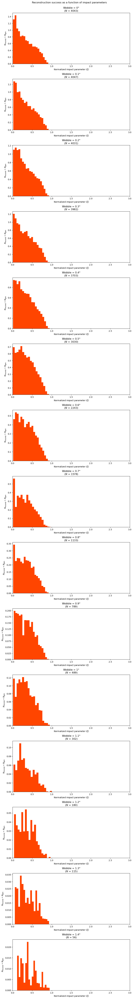

In [70]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)[validity]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=20, density=True)
    bin_interval = bin_edges[1] - bin_edges[0]
    mid_bins = bin_edges[:-1] + bin_interval/2

    ratios = np.zeros_like(mid_bins)
    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j] * N_tot * bin_interval
        dN_g = dNdxi(xi, 1e5 + 6, xi_max) * bin_interval
        ratios[j] = dN_r / dN_g
    
    plt.subplot(15, 1, i+1)
    plt.stairs(ratios, bin_edges, fill=True, color='orangered')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$N_\mathrm{reconst} \div N_\mathrm{gen}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])

plt.suptitle('Reconstruction success as a function of impact parameters')
plt.show()

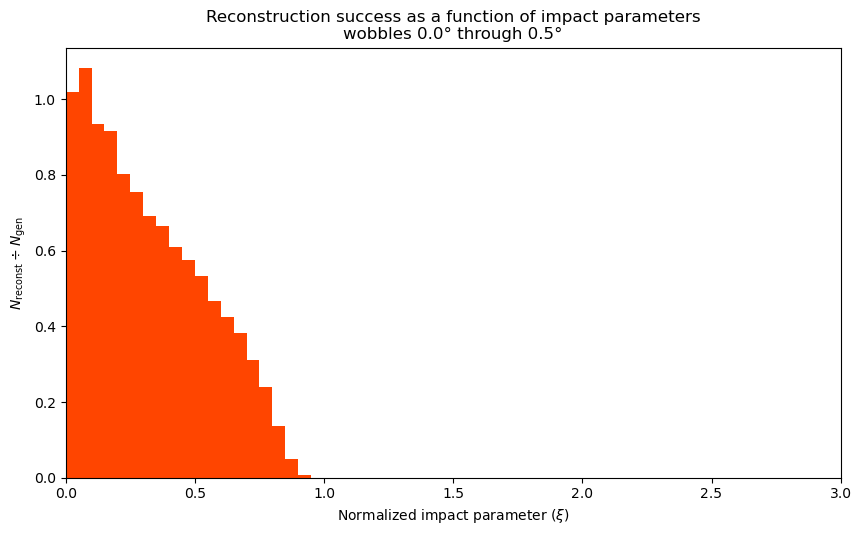

In [71]:
num_wobbles = 6

sample_xis = np.arange(0, 3.1, 0.1) 

bin_interval = 0.05
bin_edges = np.arange(0, 1 + bin_interval, bin_interval)
mid_bins = bin_edges[:-1] + bin_interval/2
ratios = np.zeros_like(mid_bins)

plt.figure(figsize=(10, 5))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles[:num_wobbles]):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)[validity]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    # N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=bin_edges, density=False)

    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j]
        dN_g = dNdxi(xi, num_wobbles * (1e5 + 6), xi_max) * bin_interval
        ratios[j] += dN_r / dN_g
    
plt.stairs(ratios, bin_edges, fill=True, color='orangered')

plt.xlabel(r'Normalized impact parameter ($\xi$)')
plt.ylabel(r'$N_\mathrm{reconst} \div N_\mathrm{gen}$')
plt.title('Reconstruction success as a function of impact parameters\n' + 'wobbles 0.0° through {}°'.format(w))

plt.xlim(sample_xis[0], sample_xis[-1])

plt.show()

In [72]:
wobbles_float = np.array([float(w) for w in wobbles])
num_reconstruct = np.zeros_like(wobbles_float)
num_reconstruct_valid = np.zeros_like(wobbles_float)  # knowable size

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    num_reconstruct[i] = len(validity)
    num_reconstruct_valid[i] = len(validity[validity])

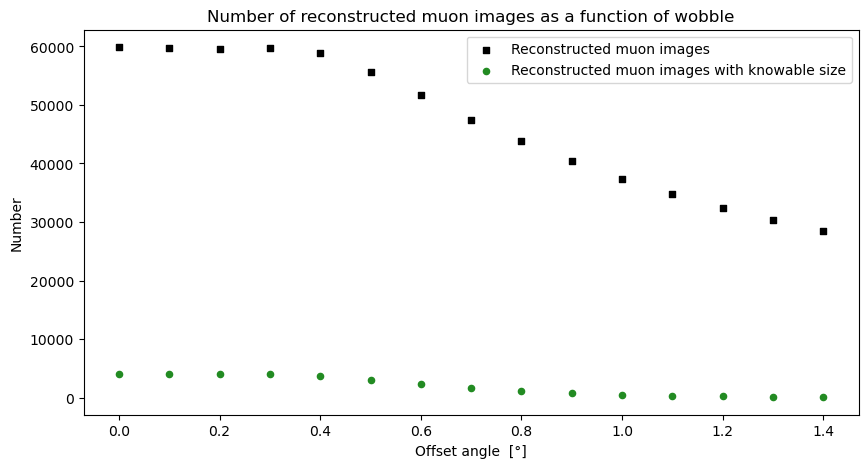

In [73]:
plt.figure(figsize=(10, 5))

plt.scatter(wobbles_float, num_reconstruct, c='black', marker='s', s=20, label='Reconstructed muon images')
plt.scatter(wobbles_float, num_reconstruct_valid, c='forestgreen', marker='o', s=20, label='Reconstructed muon images with knowable size')
    
plt.xlabel('Offset angle  [°]')
plt.ylabel('Number')
plt.title('Number of reconstructed muon images as a function of wobble')

plt.legend()
plt.show()

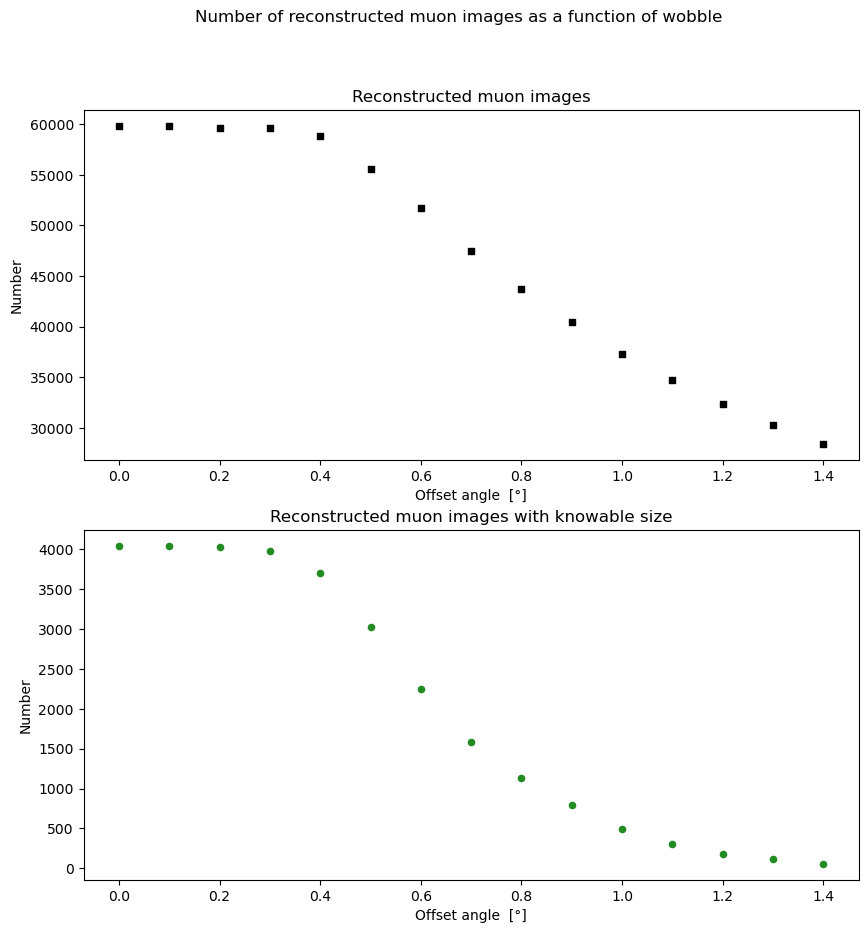

In [74]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 1, 1)
plt.scatter(wobbles_float, num_reconstruct, c='black', marker='s', s=20)
    
plt.xlabel('Offset angle  [°]')
plt.ylabel('Number')
plt.title('Reconstructed muon images')

plt.subplot(2, 1, 2)
plt.scatter(wobbles_float, num_reconstruct_valid, c='forestgreen', marker='o', s=20)
    
plt.xlabel('Offset angle  [°]')
plt.ylabel('Number')
plt.title('Reconstructed muon images with knowable size')

plt.suptitle('Number of reconstructed muon images as a function of wobble')
plt.show()